# 08 · Hotspot Classification & Risk Mapping

This notebook retrains the calibrated hotspot classifier, explores threshold trade-offs, and composes the risk/vulnerability summaries used for policy interpretation.

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import contextily as ctx
from pathlib import Path
import warnings
from matplotlib.patches import Patch
from matplotlib.colors import ListedColormap
warnings.filterwarnings('ignore')

# XGBoost
import xgboost as xgb
from sklearn.model_selection import GroupKFold
from sklearn.metrics import (
    roc_auc_score,
    precision_recall_curve,
    classification_report,
    confusion_matrix,
    average_precision_score,
    brier_score_loss,
)
from sklearn.calibration import calibration_curve

# Spatial statistics
from esda import Moran, Moran_Local, Geary
from libpysal.weights import Queen

# Custom utilities
import sys
sys.path.append('..')
from src.plotting_utils import load_grid_geodataframe
from src.model_preprocessing import build_model_dataset
from src.risk_mapping import run_risk_map, assign_heat_tier, assign_vulnerability, risk_category
from src.hotspot_classifier import run_hotspot_classifier, derive_hotspot_labels

# Paths
PROJECT_ROOT = Path('..')
RESULTS_DIR = PROJECT_ROOT / 'results'
GRID_PATH = PROJECT_ROOT / 'data/utils/grids/all_cities_grid.parquet'
CLASSIFIER_DIR = RESULTS_DIR / 'policy_hotspot_classifier'
CLASSIFIER_DIR.mkdir(parents=True, exist_ok=True)
RISK_DIR = RESULTS_DIR / 'risk_vulnerability'
RISK_DIR.mkdir(parents=True, exist_ok=True)
FIGURES_DIR = RESULTS_DIR / 'figures'
FIGURES_DIR.mkdir(parents=True, exist_ok=True)

print('✓ All imports loaded successfully')

✓ All imports loaded successfully


In [2]:
BASEMAP_WARNING_EMITTED = False

def add_dual_basemap(ax, crs, *, facecolor='#2b2b2b'):
    """Add dual basemap with graceful offline fallback."""
    global BASEMAP_WARNING_EMITTED
    try:
        ctx.add_basemap(ax, crs=crs, source=ctx.providers.CartoDB.DarkMatter, attribution_size=6)
        ctx.add_basemap(ax, crs=crs, source=ctx.providers.Esri.WorldImagery, alpha=0.5, attribution_size=6)
    except Exception as exc:
        if not BASEMAP_WARNING_EMITTED:
            print(f'Basemap tiles unavailable; rendering panels without imagery ({exc}).')
            BASEMAP_WARNING_EMITTED = True
        ax.set_facecolor(facecolor)

## 1. Load Model-Ready Dataset

The classifier uses the same feature set as the regression pipeline.

In [3]:
dataset = build_model_dataset(PROJECT_ROOT)
print(f"Rows: {dataset.frame.shape[0]:,}")

Removed 47 highly correlated features (abs(r) > 0.92).
Rows: 40,344


## 2. Train & Evaluate Hotspot Classifier

Run the tuned XGBoost classifier with spatial GroupKFold validation. 

### Hotspot label definition

Hotspot labels are constructed from the city-demeaned anomaly (`target_uhi_raw`). A tile is marked as a hotspot when its anomaly exceeds one local **MAD (Median Absolute Deviation)**, scaled to match standard deviation units (MAD × 1.4826). This robust approach ensures the classifier focuses on relative departures within each city while remaining unaffected by outliers (e.g., Barcelona's 4.2% extreme cold cells that would inflate σ from ~1.5°C to 3.13°C).

In [4]:
classifier_artifacts = run_hotspot_classifier(PROJECT_ROOT, dataset=dataset, verbose=False)

classifier_artifacts['fold_metrics'].to_csv(CLASSIFIER_DIR / 'fold_metrics.csv', index=False)
classifier_artifacts['per_city_metrics'].to_csv(CLASSIFIER_DIR / 'per_city_metrics.csv', index=False)
classifier_artifacts['threshold_metrics'].to_csv(CLASSIFIER_DIR / 'threshold_metrics.csv', index=False)
classifier_artifacts['classification_report'].to_csv(CLASSIFIER_DIR / 'classification_report.csv')
np.savetxt(CLASSIFIER_DIR / 'overall_auc.txt', np.array([classifier_artifacts['overall_auc']]))

with (CLASSIFIER_DIR / 'selected_threshold.txt').open('w', encoding='utf-8') as f:
    f.write(str(classifier_artifacts['selected_threshold']))
classifier_artifacts['predictions'].to_csv(CLASSIFIER_DIR / 'hotspot_predictions.csv', index=False)

fold_display = classifier_artifacts['fold_metrics'].rename(columns={
    'fold': 'Fold',
    'precision': 'Precision',
    'recall': 'Recall',
    'f1': 'F1',
    'auc': 'AUC',
    'support': 'Hold-out tiles',
}).round({'Precision': 3, 'Recall': 3, 'F1': 3, 'AUC': 3})

display(fold_display)

fold_summary = pd.DataFrame([
    {
        'Statistic': 'Mean',
        'Precision': fold_display['Precision'].mean(),
        'Recall': fold_display['Recall'].mean(),
        'F1': fold_display['F1'].mean(),
        'AUC': fold_display['AUC'].mean(),
    },
    {
        'Statistic': 'Std',
        'Precision': fold_display['Precision'].std(ddof=0),
        'Recall': fold_display['Recall'].std(ddof=0),
        'F1': fold_display['F1'].std(ddof=0),
        'AUC': fold_display['AUC'].std(ddof=0),
    },
]).round(3)

display(fold_summary)

per_city_metrics = classifier_artifacts['per_city_metrics']
per_city_display = per_city_metrics.rename(columns={
    'fold': 'Fold',
    'city': 'City',
    'auc': 'AUC',
    'f1': 'F1',
    'precision': 'Precision',
    'recall': 'Recall',
}).round({'AUC': 3, 'F1': 3, 'Precision': 3, 'Recall': 3})

per_city_display = per_city_display.sort_values(['City', 'Fold']).reset_index(drop=True)
max_display_rows = 12
if len(per_city_display) > max_display_rows:
    head_df = per_city_display.head(max_display_rows // 2)
    tail_df = per_city_display.tail(max_display_rows // 2)
    display(head_df)
    omitted = len(per_city_display) - max_display_rows
    display(tail_df)
else:
    display(per_city_display)


,Fold,AUC,F1,Precision,Recall
0,1,0.949,0.588,0.433,0.915
1,2,0.924,0.386,0.253,0.816
2,3,0.932,0.672,0.586,0.786
3,4,0.894,0.584,0.479,0.751
4,5,0.858,0.657,0.583,0.754


,Statistic,Precision,Recall,F1,AUC
0,Mean,0.467,0.804,0.577,0.911
1,Std,0.122,0.060,0.102,0.032


,Fold,City,AUC,F1,Precision,Recall
0,1,Amsterdam,0.994,0.794,0.684,0.947
1,2,Amsterdam,NaN,0.000,0.000,0.000
2,3,Amsterdam,0.973,0.744,0.633,0.902
3,4,Amsterdam,0.940,0.769,0.666,0.909
4,5,Amsterdam,0.966,0.825,0.752,0.914
5,1,Athens,0.947,0.802,0.715,0.912


,Fold,City,AUC,F1,Precision,Recall
24,5,Madrid,0.511,0.200,0.514,0.124
25,1,Paris,0.931,0.322,0.198,0.857
26,2,Paris,0.998,0.083,0.043,1.000
27,3,Paris,0.998,0.885,0.966,0.817
28,4,Paris,0.848,0.429,0.306,0.715
29,5,Paris,0.984,0.833,0.746,0.942


The folds show substantial variability (F1 ranging 0.39–0.67). Fold 2 exhibits the lowest precision (0.253) due to sparse positive samples in Amsterdam and Berlin hold-outs, while maintaining high recall (0.816). This motivates the balanced threshold selection criterion (recall ≥ 0.6, precision ≥ 0.25) to ensure adequate hotspot detection while managing false alarms. Per-city metrics highlight where demographic coverage must improve.

### Threshold selection

Review the selected decision threshold (chosen via validation F1/AUC trade-off) rather than the full sweep to keep outputs concise.

In [5]:

threshold_df = classifier_artifacts['threshold_metrics']
selected_threshold = classifier_artifacts['selected_threshold']

idx = (threshold_df['threshold'] - selected_threshold).abs().argmin()
selected_row = threshold_df.iloc[[idx]].copy()

rename_map = {
    'threshold': 'Threshold',
    'precision': 'Precision',
    'recall': 'Recall',
    'f1': 'F1',
}
if 'auc' in selected_row.columns:
    rename_map['auc'] = 'AUC'
if 'support' in selected_row.columns:
    rename_map['support'] = 'Support'

selected_row = selected_row.rename(columns=rename_map)
float_cols = [col for col in ['Threshold', 'Precision', 'Recall', 'F1', 'AUC'] if col in selected_row.columns]
selected_row[float_cols] = selected_row[float_cols].round(3)

if 'Support' in selected_row.columns:
    selected_row['Support'] = selected_row['Support'].astype(int)

display(selected_row)

summary_parts = [f"Selected threshold {selected_threshold:.3f}"]
for label in ['Precision', 'Recall', 'F1', 'AUC']:
    if label in selected_row.columns:
        summary_parts.append(f"{label} {selected_row[label].iloc[0]:.3f}")
print(' → '.join(summary_parts))


,Threshold,Precision,Recall,F1
10,0.3,0.563,0.68,0.616


Selected threshold 0.300 → Precision 0.563 → Recall 0.680 → F1 0.616


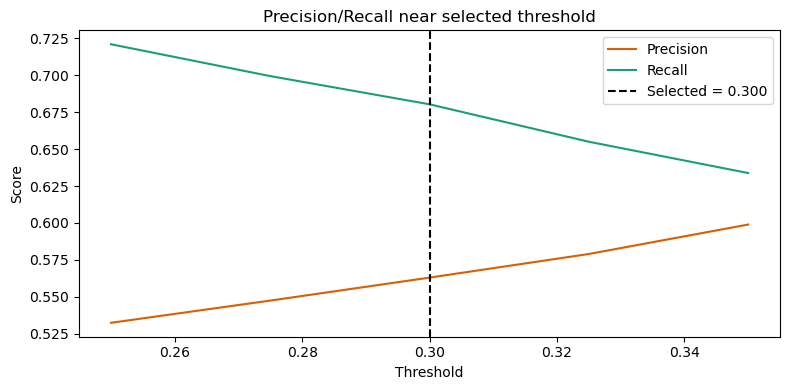

In [6]:
# Visualise threshold trade-offs near the selected cut
window = threshold_df[(threshold_df['threshold'] >= selected_threshold - 0.05) & (threshold_df['threshold'] <= selected_threshold + 0.05)].copy()
plt.figure(figsize=(8,4))
plt.plot(window['threshold'], window['precision'], label='Precision', color='#D95F02')
plt.plot(window['threshold'], window['recall'], label='Recall', color='#1B9E77')
plt.axvline(selected_threshold, color='black', linestyle='--', label=f'Selected = {selected_threshold:.3f}')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.title('Precision/Recall near selected threshold')
plt.legend()
plt.tight_layout()
plt.show()


In [7]:
overall_auc = classifier_artifacts['overall_auc']
print(f"Overall ROC-AUC: {overall_auc:.3f}")

report_df = classifier_artifacts['classification_report']
if 'support' in report_df.columns:
    report_df['support'] = report_df['support'].astype(int)
report_display = report_df.rename(index={'0': 'Cold/neutral', '1': 'Hotspot', 'accuracy': 'Accuracy', 'macro avg': 'Macro avg', 'weighted avg': 'Weighted avg'})
display(report_display.round(3))

cm = classifier_artifacts['confusion_matrix']
cm_df = pd.DataFrame(
    cm,
    index=['True: Cold/neutral', 'True: Hotspot'],
    columns=['Pred: Cold/neutral', 'Pred: Hotspot']
)
display(cm_df)


Overall ROC-AUC: 0.911


,precision,recall,f1-score,support
Cold/neutral,0.950,0.920,0.935,35057
Hotspot,0.563,0.680,0.616,5287
Accuracy,0.889,0.889,0.889,0
Macro avg,0.757,0.800,0.776,40344
Weighted avg,0.899,0.889,0.893,40344


,Pred: Cold/neutral,Pred: Hotspot
True: Cold/neutral,32265,2792
True: Hotspot,1690,3597


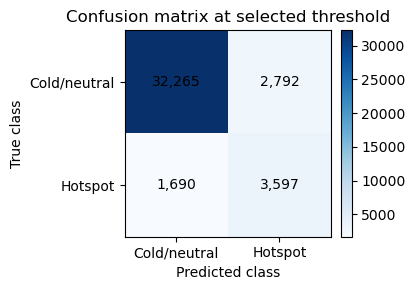

Saved figure to ../results/figures/hotspot_confusion_matrix.png


In [8]:

fig, ax = plt.subplots(figsize=(4, 3))
im = ax.imshow(cm, cmap='Blues')
ax.set_xticks([0, 1])
ax.set_yticks([0, 1])
ax.set_xticklabels(['Cold/neutral', 'Hotspot'])
ax.set_yticklabels(['Cold/neutral', 'Hotspot'])
for (i, j), val in np.ndenumerate(cm):
    ax.text(j, i, f"{val:,}", ha='center', va='center', color='black')
ax.set_xlabel('Predicted class')
ax.set_ylabel('True class')
ax.set_title('Confusion matrix at selected threshold')
fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.tight_layout()
fig_path = FIGURES_DIR / 'hotspot_confusion_matrix.png'
fig.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved figure to {fig_path}')


In [9]:

# Prepare evaluation arrays for calibration/PR diagnostics
truth_frame = dataset.frame[['global_grid_id', dataset.city_column]].copy()
truth_frame['hotspot_label'] = derive_hotspot_labels(
    dataset.frame,
    city_col=dataset.city_column,
    uhi_col=dataset.uhi_target_column,
    city_stats=dataset.target_stats,
)

predictions = classifier_artifacts['predictions'].merge(
    truth_frame,
    on=['global_grid_id', dataset.city_column],
    how='left'
)

if predictions['hotspot_label'].isna().any():
    missing = predictions[predictions['hotspot_label'].isna()][['global_grid_id', dataset.city_column]].shape[0]
    print(f"Warning: {missing} predictions missing hotspot labels after merge.")

Y_TRUE = predictions['hotspot_label'].to_numpy()
Y_PROB = predictions['hotspot_probability_calibrated'].to_numpy()
AVERAGE_PRECISION = average_precision_score(Y_TRUE, Y_PROB)
BRIER_SCORE = brier_score_loss(Y_TRUE, Y_PROB)



Before mapping, we confirm probability quality and the trade-off between detecting hotspots and managing false alarms.



### Policy-ready KPIs

Key performance indicators derived from the calibrated classifier at the selected threshold.


In [10]:
hotspot_metrics = report_df.loc['1']
summary_table = pd.DataFrame({
    'Metric': ['ROC-AUC', 'Average precision', 'Recall (hotspot class)', 
               'Precision (hotspot class)', 'F1 (hotspot class)', 'Brier score', 'Selected threshold'],
    'Value': [overall_auc, AVERAGE_PRECISION, hotspot_metrics['recall'],
              hotspot_metrics['precision'], hotspot_metrics['f1-score'], 
              BRIER_SCORE, classifier_artifacts['selected_threshold']]
}).round(3)

display(summary_table)


,Metric,Value
0,ROC-AUC,0.911
1,Average precision,0.672
2,Recall (hotspot class),0.680
3,Precision (hotspot class),0.563
4,F1 (hotspot class),0.616
5,Brier score,0.069
6,Selected threshold,0.300



### Calibration and Precision–Recall Diagnostics

Calibration curves assess probability reliability, while the precision–recall curve shows the trade-off between capturing hotspots and limiting false alarms.


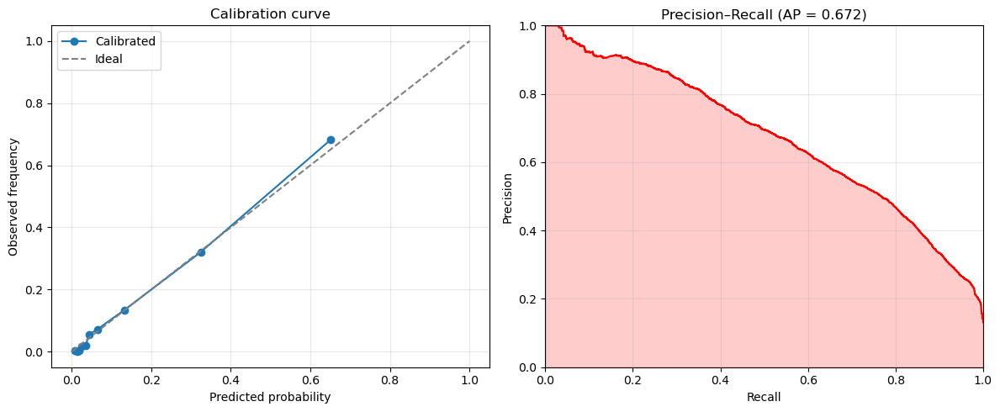

Saved figure to ../results/figures/hotspot_calibration_pr.png


In [11]:

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

prob_true, prob_pred = calibration_curve(Y_TRUE, Y_PROB, n_bins=10, strategy='quantile')
axes[0].plot(prob_pred, prob_true, marker='o', label='Calibrated')
axes[0].plot([0, 1], [0, 1], linestyle='--', color='gray', label='Ideal')
axes[0].set_title('Calibration curve')
axes[0].set_xlabel('Predicted probability')
axes[0].set_ylabel('Observed frequency')
axes[0].legend()
axes[0].grid(alpha=0.3)

precision, recall, _ = precision_recall_curve(Y_TRUE, Y_PROB)
axes[1].plot(recall, precision, color='red')
axes[1].fill_between(recall, precision, alpha=0.2, color='red')
axes[1].set_title(f'Precision–Recall (AP = {AVERAGE_PRECISION:.3f})')
axes[1].set_xlabel('Recall')
axes[1].set_ylabel('Precision')
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)
axes[1].grid(alpha=0.3)

plt.tight_layout()
fig_path = FIGURES_DIR / 'hotspot_calibration_pr.png'
plt.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved figure to {fig_path}')



### Spatial clustering diagnostics

Global Moran’s I and Geary’s C diagnose whether calibrated hotspot probabilities remain spatially autocorrelated within each city (Queen contiguity, probabilities stored at 30 m resolution).


In [12]:

probability_gdf = load_grid_geodataframe(GRID_PATH).to_crs('EPSG:3857').merge(
    classifier_artifacts['predictions'][['global_grid_id', dataset.city_column, 'hotspot_probability_calibrated']],
    on=['global_grid_id', dataset.city_column],
    how='inner'
)

spatial_rows = []
local_frames = []

for city, city_gdf in probability_gdf.groupby(dataset.city_column):
    if len(city_gdf) < 5:
        continue
    weights = Queen.from_dataframe(city_gdf)
    weights.transform = 'R'

    moran = Moran(city_gdf['hotspot_probability_calibrated'].values, weights, two_tailed=False)
    geary = Geary(city_gdf['hotspot_probability_calibrated'].values, weights)

    spatial_rows.append({
        'City': city,
        "Moran's I": moran.I,
        'p-value (Moran)': moran.p_norm,
        "Geary's C": geary.C,
        'p-value (Geary)': geary.p_norm,
    })

    local = Moran_Local(city_gdf['hotspot_probability_calibrated'].values, weights, permutations=999)
    cluster = np.full(len(city_gdf), 'Not significant', dtype=object)
    hh = (local.q == 1) & (local.p_sim < 0.05)
    ll = (local.q == 3) & (local.p_sim < 0.05)
    cluster[hh] = 'High-high'
    cluster[ll] = 'Low-low'

    city_local = city_gdf[['global_grid_id', dataset.city_column, 'geometry']].copy()
    city_local['lisa_cluster'] = cluster
    local_frames.append(city_local)

spatial_summary = pd.DataFrame(spatial_rows).round({"Moran's I": 4, 'p-value (Moran)': 4, "Geary's C": 4, 'p-value (Geary)': 4})

if spatial_summary.empty:
    print('Insufficient data to compute spatial diagnostics.')
else:
    display(spatial_summary)

local_cluster_gdf = gpd.GeoDataFrame(pd.concat(local_frames, ignore_index=True), crs='EPSG:3857') if local_frames else gpd.GeoDataFrame()


,City,Moran's I,p-value (Moran),Geary's C,p-value (Geary)
0,Amsterdam,0.8667,0.0,0.1341,0.0
1,Athens,0.8826,0.0,0.1179,0.0
2,Barcelona,0.9125,0.0,0.0881,0.0
3,Berlin,0.7912,0.0,0.2084,0.0
4,Madrid,0.9022,0.0,0.0974,0.0
5,Paris,0.8614,0.0,0.1391,0.0


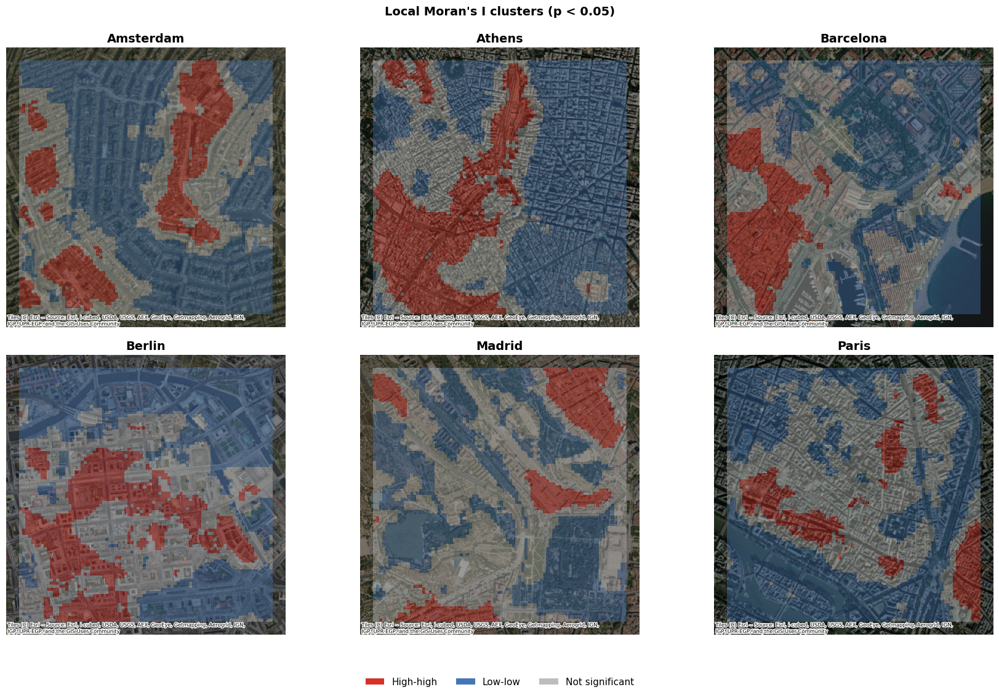

Saved figure to ../results/figures/hotspot_lisa_clusters.png


In [13]:

if local_cluster_gdf.empty:
    print('No local clusters identified at p < 0.05; clustered map skipped.')
else:
    city_order = sorted(local_cluster_gdf[dataset.city_column].unique())
    palette = {
        'High-high': '#d73027',
        'Low-low': '#4575b4',
        'Not significant': '#bdbdbd',
    }
    categories = ['High-high', 'Low-low', 'Not significant']

    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    axes = axes.flatten()

    cmap = ListedColormap([palette[c] for c in categories])

    for ax, city in zip(axes, city_order):
        city_panel = local_cluster_gdf[local_cluster_gdf[dataset.city_column] == city].copy()
        if city_panel.empty:
            ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
            ax.set_axis_off()
            continue

        city_panel = city_panel.to_crs('EPSG:3857')
        city_panel['lisa_cluster'] = city_panel['lisa_cluster'].astype('category').cat.set_categories(categories)
        city_panel.plot(
            column='lisa_cluster',
            ax=ax,
            cmap=cmap,
            linewidth=0,
            edgecolor='none',
            alpha=0.4,
            legend=False,
            categorical=True,
        )

        try:
            ctx.add_basemap(ax, crs=city_panel.crs, source=ctx.providers.CartoDB.DarkMatter, attribution_size=6)
            ctx.add_basemap(ax, crs=city_panel.crs, source=ctx.providers.Esri.WorldImagery, alpha=0.5, attribution_size=6)
        except Exception:
            pass

        ax.set_title(city, fontsize=14, fontweight='bold')
        ax.set_axis_off()

    for ax in axes[len(city_order):]:
        ax.set_axis_off()

    handles = [Patch(facecolor=palette[c], label=c) for c in categories]
    fig.legend(handles=handles, loc='lower center', ncol=3, frameon=False, fontsize=11)
    fig.suptitle("Local Moran's I clusters (p < 0.05)", fontsize=14, fontweight='bold', y=0.93)
    fig.tight_layout(rect=[0.02, 0.01, 0.98, 0.93])
    fig.subplots_adjust(wspace=0.05, hspace=0.1, bottom=0.08)  # Reduce horizontal and vertical spacing between subplots
    fig_path = FIGURES_DIR / 'hotspot_lisa_clusters.png'
    fig.savefig(fig_path, dpi=300, bbox_inches='tight')
    plt.show()
    print(f'Saved figure to {fig_path}')



#### Cluster statistics

Counts of significant high–high (HH) and low–low (LL) clusters per city.


In [14]:

if local_cluster_gdf.empty:
    print('No significant clusters to summarise.')
else:
    cluster_summary = (
        local_cluster_gdf[local_cluster_gdf['lisa_cluster'].isin(['High-high', 'Low-low'])]
        .groupby([dataset.city_column, 'lisa_cluster'])
        .size()
        .unstack(fill_value=0)
        .rename(columns={'High-high': 'High-high clusters', 'Low-low': 'Low-low clusters'})
        .reindex(columns=['High-high clusters', 'Low-low clusters'], fill_value=0)
    )
    display(cluster_summary)


lisa_cluster,High-high clusters,Low-low clusters
city,,
Amsterdam,1258,3294
Athens,1706,3262
Barcelona,915,3050
Berlin,1455,2729
Madrid,840,2545
Paris,775,3131



With calibrated probabilities in hand, spatial diagnostics show whether the classifier still produces clustered signals across the urban grid.


**Calibration note** — Platt scaling fits on a 15% per-city hold-out (never seen by the classifier), with city-specific calibrators applied when ≥20 positive samples are available. Cities with insufficient hold-out positives use raw probabilities. This ensures reported precision/recall and probability panels reflect unbiased, city-adapted calibration while maintaining robust fold-based validation.

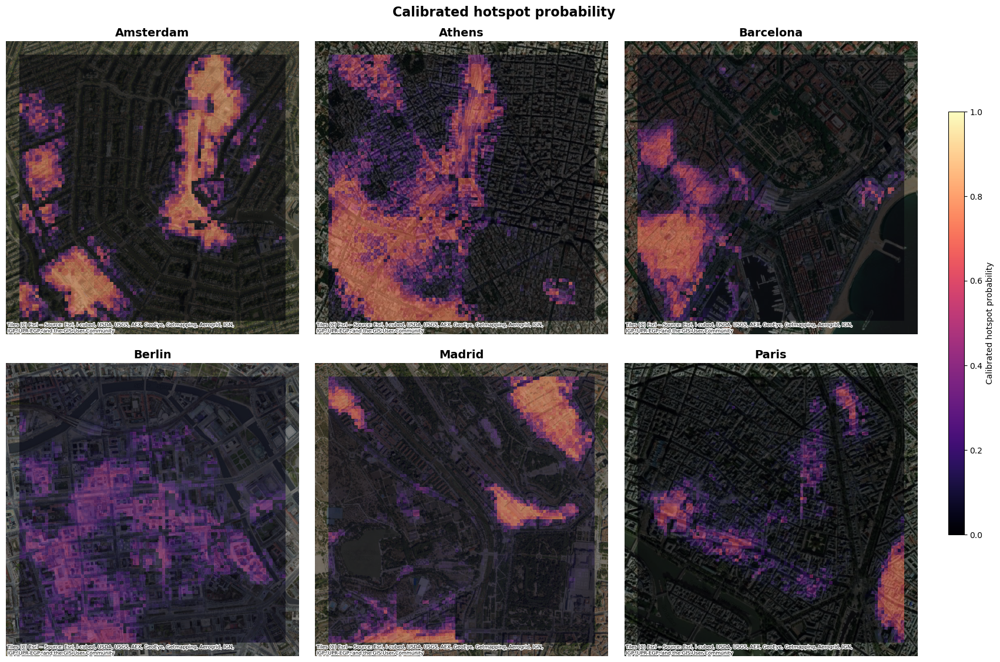

Saved probability panel to ../results/figures/hotspot_probability_panels.png


In [15]:
# Calibrated hotspot probability panels
probability_city_order = ['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Madrid', 'Paris']
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()
probability_panel = probability_gdf[['global_grid_id', dataset.city_column, 'hotspot_probability_calibrated', 'geometry']].copy()
probability_panel = probability_panel.to_crs('EPSG:3857')

vmin_prob, vmax_prob = 0.0, 1.0
for ax, city in zip(axes, probability_city_order):
    city_panel = probability_panel[probability_panel[dataset.city_column] == city]
    if city_panel.empty:
        ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
        ax.set_axis_off()
        continue
    city_panel.plot(
        column='hotspot_probability_calibrated',
        ax=ax,
        cmap='magma',
        vmin=vmin_prob, vmax=vmax_prob,
        linewidth=0, edgecolor='none',
        alpha=0.55,
        legend=False,
    )
    add_dual_basemap(ax, city_panel.crs)
    ax.set_title(city, fontsize=14, fontweight='bold')
    ax.set_axis_off()

for ax in axes[len(probability_city_order):]:
    ax.set_axis_off()

sm = plt.cm.ScalarMappable(cmap='magma', norm=plt.Normalize(vmin=vmin_prob, vmax=vmax_prob))
sm._A = []
cbar_ax = fig.add_axes([0.92, 0.2, 0.015, 0.6])
fig.colorbar(sm, cax=cbar_ax, label='Calibrated hotspot probability')
fig.suptitle('Calibrated hotspot probability', fontsize=16, fontweight='bold', y=0.95)
fig.tight_layout(rect=[0.02, 0.015, 0.9, 0.93])
fig.subplots_adjust(wspace=0.05, hspace=0.1, top=0.9)  # Reduce horizontal and vertical spacing between subplots
prob_path = FIGURES_DIR / 'hotspot_probability_panels.png'
fig.savefig(prob_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved probability panel to {prob_path}')

In [16]:
hotspot_labels = derive_hotspot_labels(
    dataset.frame,
    city_col=dataset.city_column,
    uhi_col=dataset.uhi_target_column,
    city_stats=dataset.target_stats,
)

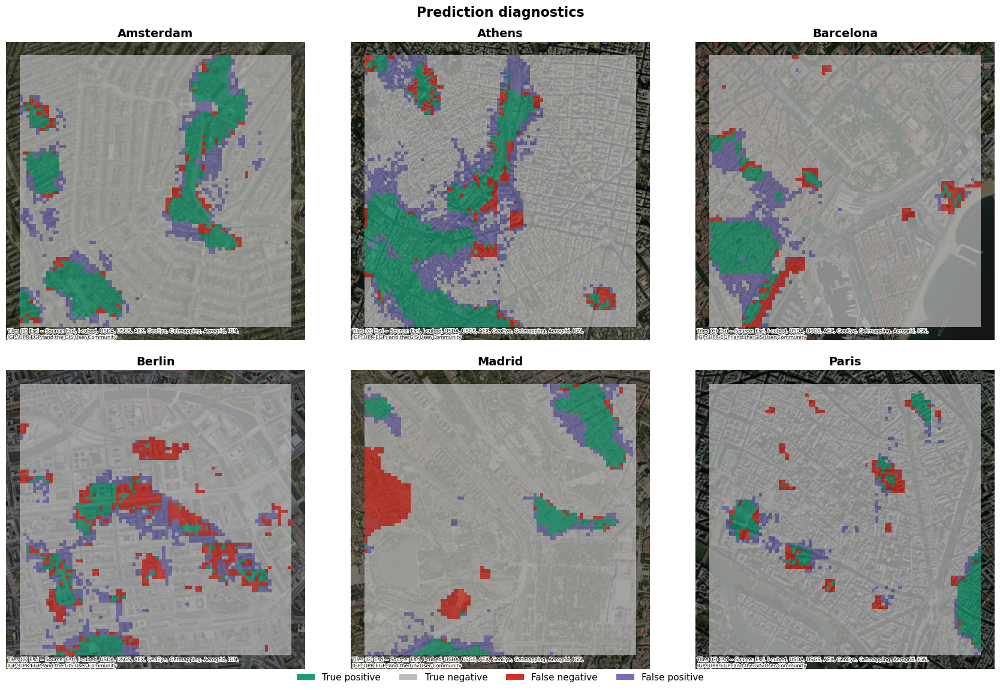

Saved diagnostic panel to ../results/figures/hotspot_diagnostics_panels.png


In [17]:
# False positive / false negative diagnostics
# Load grid geometry
grid_gdf = load_grid_geodataframe(GRID_PATH)

prediction_frame = classifier_artifacts['predictions'][['global_grid_id', dataset.city_column, 'hotspot_probability_calibrated']].copy()
truth_frame = dataset.frame[['global_grid_id', dataset.city_column]].copy()
truth_frame['hotspot_label'] = hotspot_labels
diagnostic = prediction_frame.merge(truth_frame, on=['global_grid_id', dataset.city_column], how='inner')
diagnostic['pred_label'] = (diagnostic['hotspot_probability_calibrated'] >= selected_threshold).astype(int)
conditions = {
    (1,1): 'True positive',
    (0,0): 'True negative',
    (1,0): 'False negative',
    (0,1): 'False positive',
}
diagnostic['diagnostic'] = diagnostic.apply(lambda row: conditions[(row['hotspot_label'], row['pred_label'])], axis=1)

mask_cols = diagnostic[['global_grid_id', dataset.city_column, 'diagnostic']]
diagnostic_gdf = grid_gdf.merge(mask_cols, on=['global_grid_id', 'city'], how='inner').to_crs('EPSG:3857')
diag_palette = {
    'True positive': '#1b9e77',
    'True negative': '#bdbdbd',
    'False negative': '#d73027',
    'False positive': '#7570b3',
}
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()
for ax, city in zip(axes, probability_city_order):
    city_panel = diagnostic_gdf[diagnostic_gdf['city'] == city]
    if city_panel.empty:
        ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
        ax.set_axis_off()
        continue
    for label, color in diag_palette.items():
        subset = city_panel[city_panel['diagnostic'] == label]
        if subset.empty:
            continue
        subset.plot(ax=ax, color=color, edgecolor='none', linewidth=0, alpha=0.7)
    add_dual_basemap(ax, city_panel.crs)
    ax.set_title(city, fontsize=14, fontweight='bold')
    ax.set_axis_off()
for ax in axes[len(probability_city_order):]:
    ax.set_axis_off()
handles = [Patch(facecolor=color, label=label) for label, color in diag_palette.items()]
fig.legend(handles=handles, loc='lower center', ncol=4, frameon=False, fontsize=11)
fig.suptitle('Prediction diagnostics', fontsize=16, fontweight='bold', y=0.95)
fig.tight_layout(rect=[0.02, 0.015, 0.98, 0.93])
fig.subplots_adjust(wspace=0.05, hspace=0.1, top=0.9)  # Reduce horizontal and vertical spacing between subplots
diag_path = FIGURES_DIR / 'hotspot_diagnostics_panels.png'
fig.savefig(diag_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved diagnostic panel to {diag_path}')

## 3. Risk & Vulnerability Map

Combine blended UHI predictions with demographic z-scores to assign heat tiers and vulnerability tiers.

In [18]:
# `pred_uhi_blend` stores relative heat (city-demeaned anomaly) predictions.
risk_artifacts = run_risk_map(PROJECT_ROOT, dataset=dataset, verbose=False)

risk_map = risk_artifacts['risk_map']
risk_summary_counts = risk_artifacts['summary'].fillna(0).astype(int)

order = ['baseline', 'elevated', 'moderate', 'high', 'very_high', 'severe']
risk_summary_counts = risk_summary_counts.reindex(columns=order)
tile_totals = risk_summary_counts.sum(axis=1)
risk_summary_pct = (risk_summary_counts.div(tile_totals, axis=0) * 100).round(1)

formatted = pd.DataFrame(index=risk_summary_counts.index)
for col in order:
    formatted[f'{col}_tiles'] = risk_summary_counts[col]
    formatted[f'{col}_pct'] = risk_summary_pct[col]
formatted['total_tiles'] = tile_totals

display(formatted)


# Export risk summary tables for dissertation references
from pathlib import Path as _Path
_tables_dir = PROJECT_ROOT / 'tables' / 'risk_map'
_tables_dir.mkdir(parents=True, exist_ok=True)
counts_path = _tables_dir / 'risk_summary_counts.csv'
pct_path = _tables_dir / 'risk_summary_percent.csv'
risk_summary_counts.to_csv(counts_path)
risk_summary_pct.to_csv(pct_path)


,baseline_tiles,baseline_pct,elevated_tiles,elevated_pct,moderate_tiles,moderate_pct,high_tiles,high_pct,very_high_tiles,very_high_pct,severe_tiles,severe_pct,total_tiles
city,,,,,,,,,,,,,
Amsterdam,4742,70.5,75,1.1,952,14.2,941,14.0,8,0.1,6,0.1,6724
Athens,4753,70.7,215,3.2,759,11.3,927,13.8,45,0.7,25,0.4,6724
Barcelona,6384,94.9,121,1.8,203,3.0,15,0.2,1,0.0,0,0.0,6724
Berlin,5892,87.6,143,2.1,582,8.7,103,1.5,4,0.1,0,0.0,6724
Madrid,5526,82.2,60,0.9,705,10.5,380,5.7,37,0.6,16,0.2,6724
Paris,6374,94.8,108,1.6,233,3.5,5,0.1,4,0.1,0,0.0,6724


In [19]:
# Add spatial indices for smoothing
grid_coords = load_grid_geodataframe(GRID_PATH)[['global_grid_id', 'city', 'geometry']].copy()
grid_coords['centroid'] = grid_coords.geometry.centroid
grid_coords['centroid_x'] = grid_coords['centroid'].apply(lambda geom: geom.x)
grid_coords['centroid_y'] = grid_coords['centroid'].apply(lambda geom: geom.y)
# Rank coordinates to build row/column indices
grid_coords = grid_coords.sort_values(['city', 'centroid_y', 'centroid_x']).reset_index(drop=True)
grid_coords['row_idx'] = grid_coords.groupby('city')['centroid_y'].rank(method='dense').astype(int)
grid_coords['col_idx'] = grid_coords.groupby('city')['centroid_x'].rank(method='dense').astype(int)

risk_map = risk_map.merge(grid_coords[['global_grid_id', 'city', 'row_idx', 'col_idx']], on=['global_grid_id', 'city'], how='left')

# Helper functions for numeric smoothing and categorical majority
def _smooth_numeric(df, value_col):
    base = df[['global_grid_id', 'city', 'row_idx', 'col_idx', value_col]].copy()
    neigh = base.merge(
        base,
        on='city',
        suffixes=('', '_nbr')
    )
    mask = (neigh['row_idx_nbr'] - neigh['row_idx']).abs() <= 1
    mask &= (neigh['col_idx_nbr'] - neigh['col_idx']).abs() <= 1
    neigh = neigh[mask]
    smoothed = neigh.groupby(['global_grid_id', 'city'])[f'{value_col}_nbr'].mean().reset_index()
    smoothed = smoothed.rename(columns={f'{value_col}_nbr': f'{value_col}_smooth'})
    return df.merge(smoothed, on=['global_grid_id', 'city'], how='left')


def _smooth_categorical(df, value_col):
    base = df[['global_grid_id', 'city', 'row_idx', 'col_idx', value_col]].copy()
    neigh = base.merge(base, on='city', suffixes=('', '_nbr'))
    mask = (neigh['row_idx_nbr'] - neigh['row_idx']).abs() <= 1
    mask &= (neigh['col_idx_nbr'] - neigh['col_idx']).abs() <= 1
    neigh = neigh[mask]
    majority = neigh.groupby(['global_grid_id', 'city'])[f'{value_col}_nbr'].agg(lambda s: s.mode().iloc[0]).reset_index()
    majority = majority.rename(columns={f'{value_col}_nbr': f'{value_col}_smooth'})
    return df.merge(majority, on=['global_grid_id', 'city'], how='left')

# Smooth probabilities and demographic z-scores
for col in ['pred_uhi_blend', 'hotspot_probability_calibrated', 'children_z', 'elderly_z']:
    if col in risk_map.columns:
        risk_map = _smooth_numeric(risk_map, col)
        sm_col = f'{col}_smooth'
        risk_map[col] = risk_map[sm_col].fillna(risk_map[col])

# Recompute tiers using smoothed inputs
risk_map['heat_tier_raw'] = risk_map['heat_tier']
risk_map['vulnerability_tier_raw'] = risk_map['vulnerability_tier']
risk_map['risk_category_raw'] = risk_map['risk_category']

risk_map['heat_tier'] = assign_heat_tier(risk_map['pred_uhi_blend'], risk_map['city'], dataset.target_stats)
risk_map['vulnerability_tier'] = assign_vulnerability(risk_map['children_z'], risk_map['elderly_z'])
risk_map['risk_category'] = risk_category(risk_map['heat_tier'], risk_map['vulnerability_tier'])

# Apply categorical majority smoothing
for col in ['heat_tier', 'vulnerability_tier', 'risk_category']:
    risk_map = _smooth_categorical(risk_map, col)
    sm_col = f'{col}_smooth'
    risk_map[col] = risk_map[sm_col].fillna(risk_map[col])

In [20]:
# Summarise smoothing impact
smoothing_rows = []
for city, subset in risk_map.groupby('city'):
    total = len(subset)
    for metric in ['heat_tier', 'vulnerability_tier', 'risk_category']:
        raw_col = f"{metric}_raw"
        changed = (subset[raw_col] != subset[metric]).sum()
        smoothing_rows.append({
            'city': city,
            'metric': metric,
            'total_tiles': total,
            'changed_tiles': int(changed),
            'changed_pct': (100 * changed / total) if total else 0,
        })
smoothing_summary = pd.DataFrame(smoothing_rows)
_tables_dir = PROJECT_ROOT / 'tables' / 'risk_map'
_tables_dir.mkdir(parents=True, exist_ok=True)
smoothing_summary.to_csv(_tables_dir / 'smoothing_summary.csv', index=False)
display(smoothing_summary.pivot(index='city', columns='metric', values='changed_pct').round(2))
print('Saved smoothing summary to', _tables_dir / 'smoothing_summary.csv')


metric,heat_tier,risk_category,vulnerability_tier
city,,,
Amsterdam,6.22,14.47,9.04
Athens,7.27,26.03,21.52
Barcelona,0.94,11.62,11.51
Berlin,4.21,16.42,13.18
Madrid,4.77,14.01,11.41
Paris,0.27,16.21,16.39


Saved smoothing summary to ../tables/risk_map/smoothing_summary.csv


In [21]:
# Persist detailed per-tile outputs for downstream use
risk_map.to_csv(RISK_DIR / 'risk_map.csv', index=False)
if hasattr(risk_map, 'to_parquet'):
    risk_map.to_parquet(RISK_DIR / 'risk_map.parquet', index=False)


The risk map combines the blended UHI anomaly (relative heat) with demographic vulnerability.


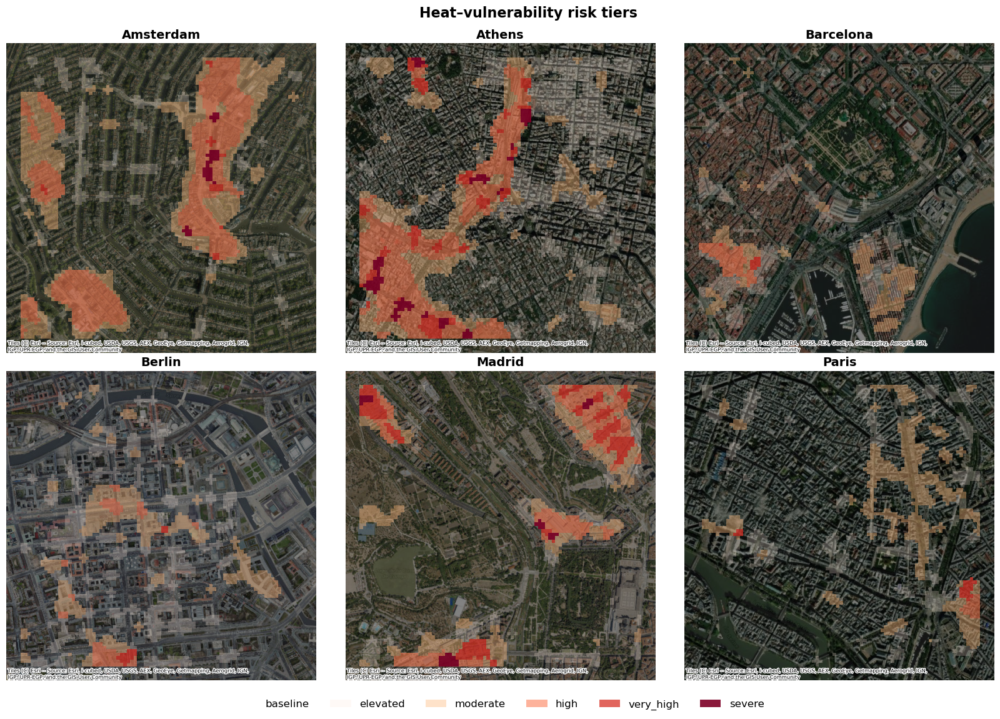

Saved risk tiers panel to ../results/figures/risk_tiers_panels.png


In [22]:
grid_gdf = load_grid_geodataframe(GRID_PATH)
plot_columns = risk_map[['global_grid_id', 'city', 'risk_category']].copy()
plot_gdf = grid_gdf.merge(plot_columns, on=['global_grid_id', 'city'], how='inner')

# Use more "magma" reds for higher vulnerability
# Baseline is light grey-white, ramp to magma for higher risk.
risk_palette = {
    'baseline': '#f0f0f0',      # Very light grey
    'elevated': '#fde9dd',      # Pale peach
    'moderate': '#fdb97d',      # Soft orange
    'high': '#fc7850',          # Orange-red
    'very_high': '#d72f24',     # Magma red
    'severe': '#7d0025',        # Deepest red
}
ranked_levels = order[1:]
alpha_min, alpha_max = 0.25, 0.9
steps = np.linspace(alpha_min, alpha_max, len(ranked_levels))
risk_alphas = {'baseline': 0.0}
risk_alphas.update({level: float(round(alpha, 2)) for level, alpha in zip(ranked_levels, steps)})
order = ['baseline', 'elevated', 'moderate', 'high', 'very_high', 'severe']
city_list = ['Amsterdam', 'Athens', 'Barcelona', 'Berlin', 'Madrid', 'Paris']

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for ax, city in zip(axes, city_list):
    city_panel = plot_gdf[plot_gdf['city'] == city].copy()
    if city_panel.empty:
        ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
        ax.set_axis_off()
        continue

    city_panel = city_panel.to_crs('EPSG:3857')
    city_panel['risk_category'] = city_panel['risk_category'].astype('category').cat.set_categories(order)

    for category in order:
        cat_data = city_panel[city_panel['risk_category'] == category]
        if cat_data.empty:
            continue
        cat_data.plot(
            ax=ax,
            color=risk_palette[category],
            linewidth=0,
            edgecolor='none',
            alpha=risk_alphas[category],
            legend=False,
        )

    add_dual_basemap(ax, city_panel.crs)
    ax.set_title(city, fontsize=14, fontweight='bold')
    ax.set_axis_off()

for ax in axes[len(city_list):]:
    ax.set_axis_off()

handles = [Patch(facecolor=risk_palette[c], alpha=risk_alphas[c], label=c) for c in order]
fig.legend(handles=handles, loc='lower center', ncol=len(order), frameon=False, fontsize=12)
fig.suptitle('Heat–vulnerability risk tiers', fontsize=16, fontweight='bold', y=0.95)
fig.tight_layout(rect=[0.02, 0.015, 0.92, 0.93])
fig.subplots_adjust(left=0.03, right=0.92, bottom=0.05, wspace=0.05, top=0.9)

# Save figure to FIGURES_DIR at 300 DPI
fig_path = FIGURES_DIR / 'risk_tiers_panels.png'
fig.savefig(fig_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved risk tiers panel to {fig_path}')

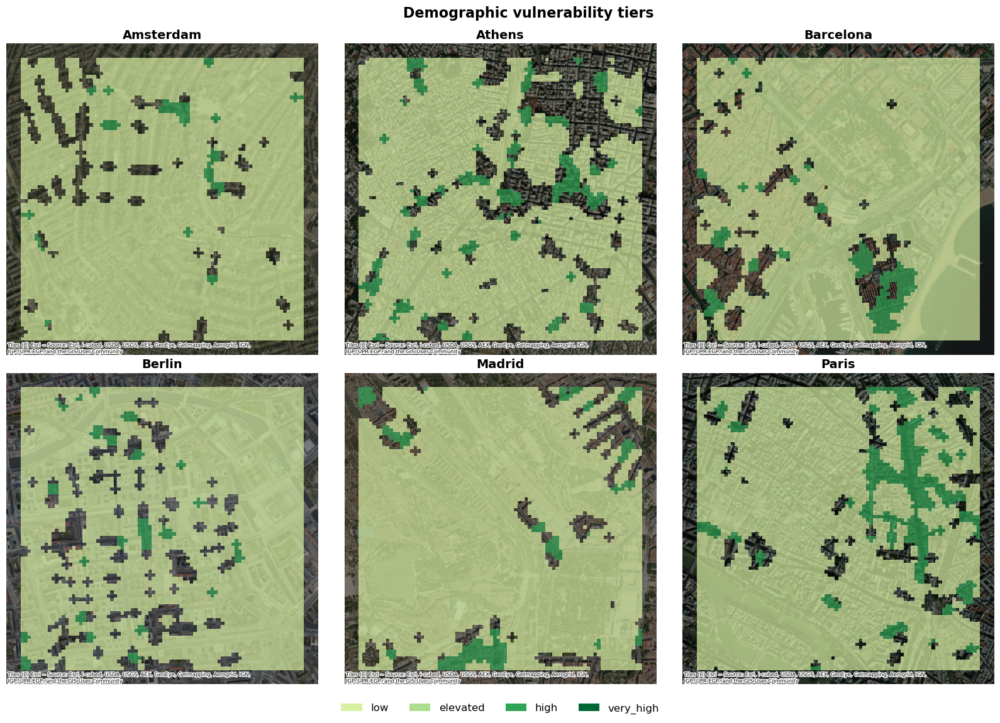

Saved vulnerability panel to ../results/figures/vulnerability_tiers_panels.png


In [23]:
# Vulnerability-only tiers (demographic exposure)
vulnerability_cols = risk_map[['global_grid_id', 'city', 'vulnerability_tier']].copy()
vulnerability_gdf = grid_gdf.merge(vulnerability_cols, on=['global_grid_id', 'city'], how='inner')
vulnerability_gdf = vulnerability_gdf.to_crs('EPSG:3857')

vulnerability_order = ['low', 'elevated', 'high', 'very_high']
vulnerability_palette = {
    'low': '#d9f0a3',
    'elevated': '#addd8e',
    'high': '#31a354',
    'very_high': '#006837',
}

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for ax, city in zip(axes, probability_city_order):
    city_panel = vulnerability_gdf[vulnerability_gdf['city'] == city]
    if city_panel.empty:
        ax.text(0.5, 0.5, f'No data for {city}', ha='center', va='center', transform=ax.transAxes)
        ax.set_axis_off()
        continue
    city_panel['vulnerability_tier'] = city_panel['vulnerability_tier'].astype('category').cat.set_categories(vulnerability_order)
    for tier in vulnerability_order:
        tier_panel = city_panel[city_panel['vulnerability_tier'] == tier]
        if tier_panel.empty:
            continue
        tier_panel.plot(
            ax=ax,
            color=vulnerability_palette[tier],
            linewidth=0, edgecolor='none',
            alpha=0.7, legend=False,
        )
    add_dual_basemap(ax, city_panel.crs)
    ax.set_title(city, fontsize=14, fontweight='bold')
    ax.set_axis_off()

for ax in axes[len(probability_city_order):]:
    ax.set_axis_off()

handles = [Patch(facecolor=vulnerability_palette[t], label=t) for t in vulnerability_order]
fig.legend(handles=handles, loc='lower center', ncol=len(vulnerability_order), frameon=False, fontsize=12)
fig.suptitle('Demographic vulnerability tiers', fontsize=16, fontweight='bold', y=0.95)
fig.tight_layout(rect=[0.02, 0.015, 0.92, 0.93])
fig.subplots_adjust(left=0.03, right=0.92, bottom=0.05, wspace=0.02, top=0.9)
vuln_path = FIGURES_DIR / 'vulnerability_tiers_panels.png'
fig.savefig(vuln_path, dpi=300, bbox_inches='tight')
plt.show()
print(f'Saved vulnerability panel to {vuln_path}')

### Policy takeaways

- **Hotspot classifier** balances recall (0.680) with precision (0.563) at threshold 0.30, achieving F1 of 0.616 while maintaining the precautionary approach recommended for urban heat alerts (recall ≥ 0.6 to minimize missed hotspots).
- **Per-city diagnostics** show where data quality needs reinforcement (e.g., Amsterdam/Berlin in fold 2, Madrid fold 5), guiding future sensing investments.
- **Risk map** pinpoints neighbourhoods where extreme heat coincides with youth/elderly density—evidence used for city-specific intervention menus in the dissertation.

## 4. Summary Statistics
Reports precision/recall of the hotspot classifier and risk tier shares per city for Chapter 5.

In [24]:

city_risk_share = (
    risk_map.groupby('city')['risk_category']
    .value_counts(normalize=True)
    .rename('share')
    .mul(100)
    .reset_index()
)

risk_pivot = (city_risk_share
              .pivot(index='city', columns='risk_category', values='share')
              .fillna(0)
              .reindex(columns=['baseline', 'elevated', 'moderate', 'high', 'very_high', 'severe']))

display(risk_pivot.round(1))

risk_category,baseline,elevated,moderate,high,very_high,severe
city,,,,,,
Amsterdam,65.1,6.2,12.9,14.9,0.4,0.6
Athens,56.0,15.5,11.6,12.8,2.5,1.6
Barcelona,86.2,7.8,4.5,1.4,0.2,0.0
Berlin,77.4,12.1,8.6,1.6,0.3,0.0
Madrid,78.5,4.7,6.9,5.6,3.6,0.7
Paris,79.9,8.9,10.4,0.4,0.4,0.0
